In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xkxukZ8QTDpEcPHsfnFs")
project = rf.workspace("prita-hamidanti-dpbne").project("dataset-uas")
version = project.version(1)
dataset = version.download("yolov5")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 696.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to dataset-uas-1 in yolov5pytorch:: 100%|██████████| 224/224 [00:00<00:00, 5745.90it/s]


In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16802, done.
remote: Counting objects: 100% (123/123), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 16802 (delta 54), reused 67 (delta 27), pack-reused 16679
Receiving objects: 100% (16802/16802), 15.47 MiB | 12.08 MiB/s, done.
Resolving deltas: 100% (11533/11533), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.9/802.9 kB 30.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 52.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 44.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account 

In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/DATA_UAS-1"

In [6]:
from roboflow import Roboflow
rf = Roboflow(api_key="xkxukZ8QTDpEcPHsfnFs", model_format="yolov5", notebook="ultralytics")
dataset = rf.workspace("prita-hamidanti-dpbne").project("dataset-uas").version("1").download(location="/content/my-datasets")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/my-datasets in yolov5pytorch:: 100%|██████████| 224/224 [00:00<00:00, 4922.27it/s]


In [9]:
!python train.py --img 416 --batch 16 --epochs 25 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-07-20 04:22:11.894479: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-20 04:22:11.894555: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-20 04:22:11.896586: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/my-datasets/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, sin

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6168), started 0:36:13 ago. (Use '!kill 6168' to kill it.)

<IPython.core.display.Javascript object>

In [11]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/my-datasets/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-345-g8003649c Python-3.10.12 torch-2.3.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/11 /content/my-datasets/test/images/cermin-14-_jpg.rf.6c94df05b4d74a30405712900070afa6.jpg: 416x416 2 mirrors, 218.6ms
image 2/11 /content/my-datasets/test/images/cermin-54-_jpg.rf.5a84f7054ce4ca791b327fd615b3e69c.jpg: 416x416 3 mirrors, 2 sofas, 194.8ms
image 3/11 /content/my-datasets/test/images/sofa-11-_jpg.rf.2a8ebca884f596c80

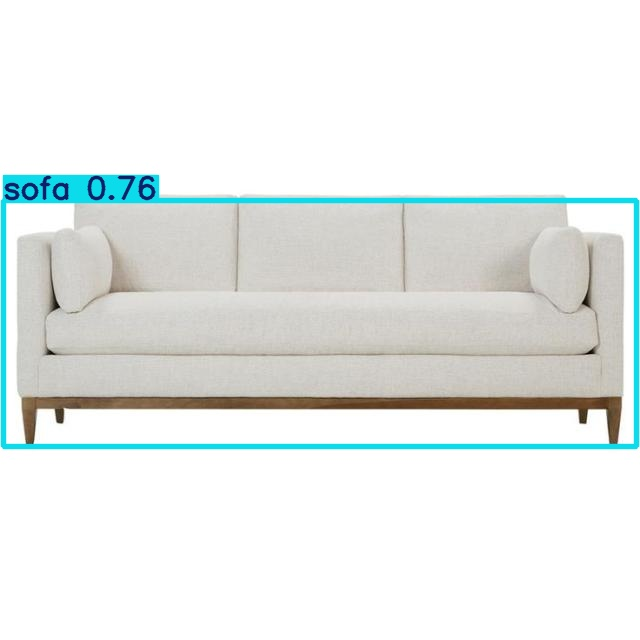

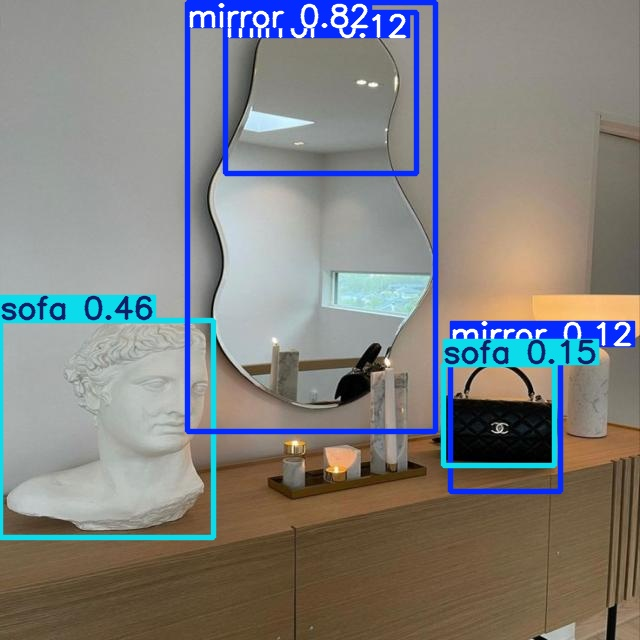

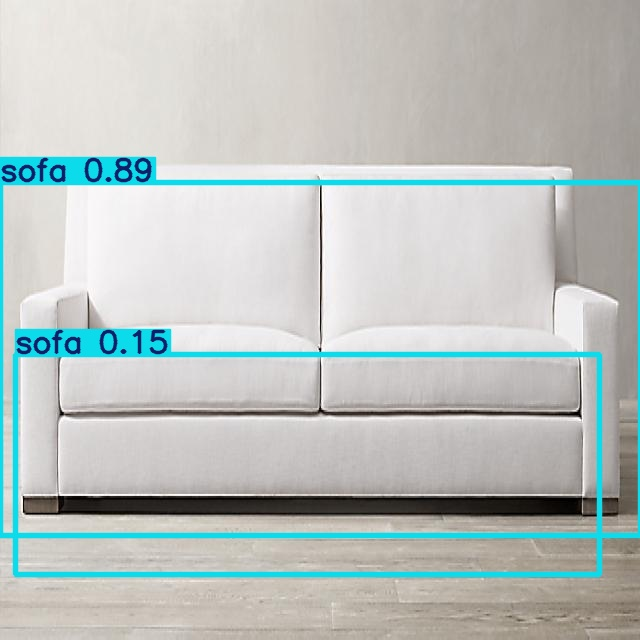

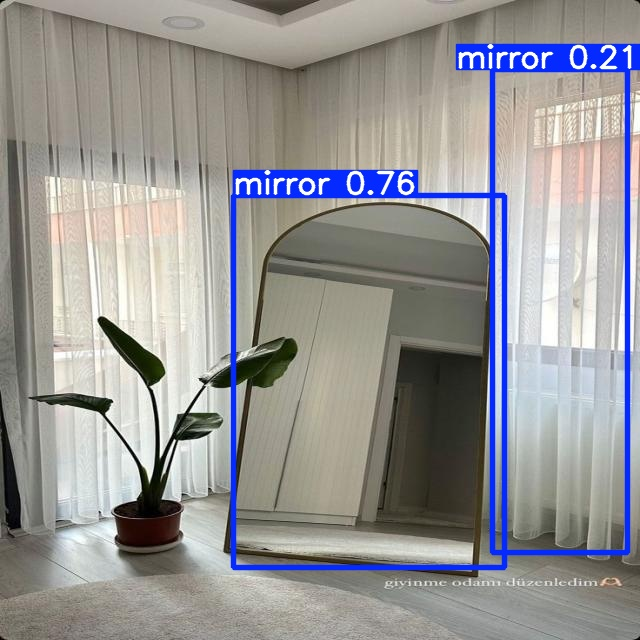

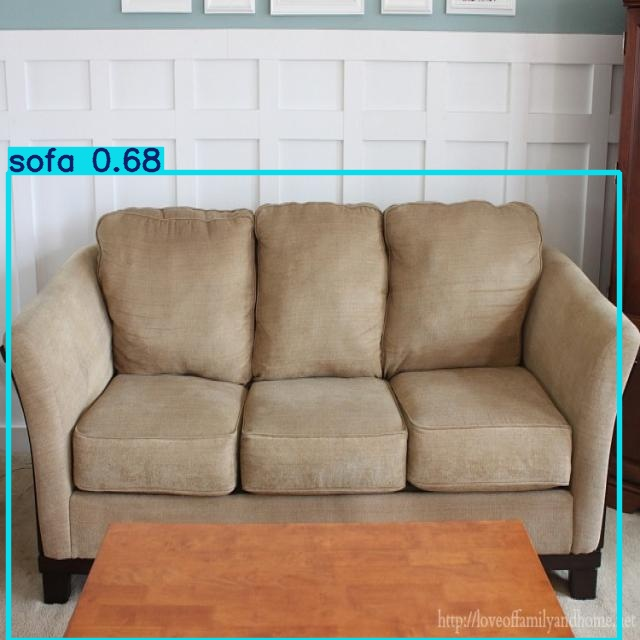

...

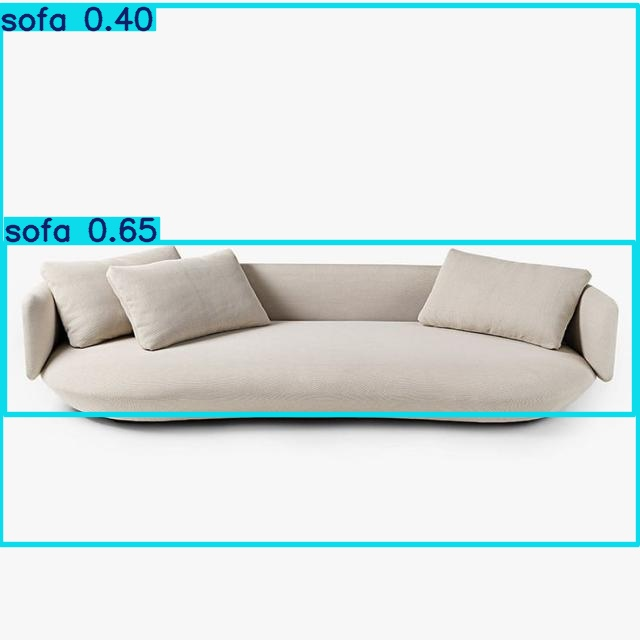

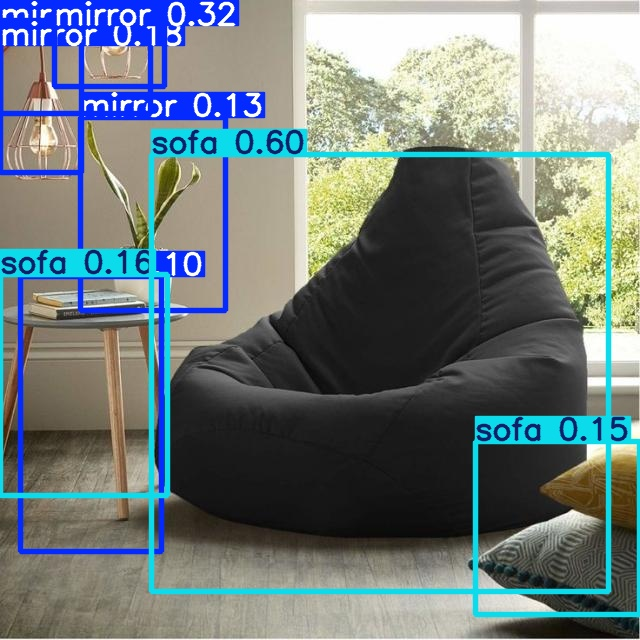

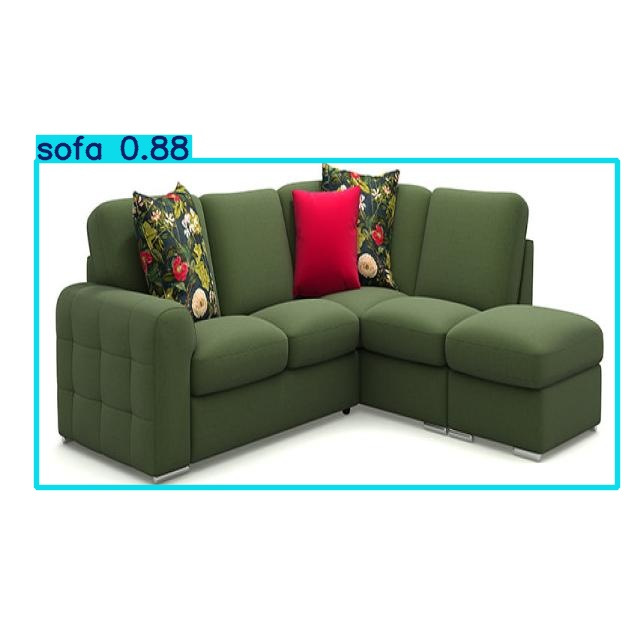

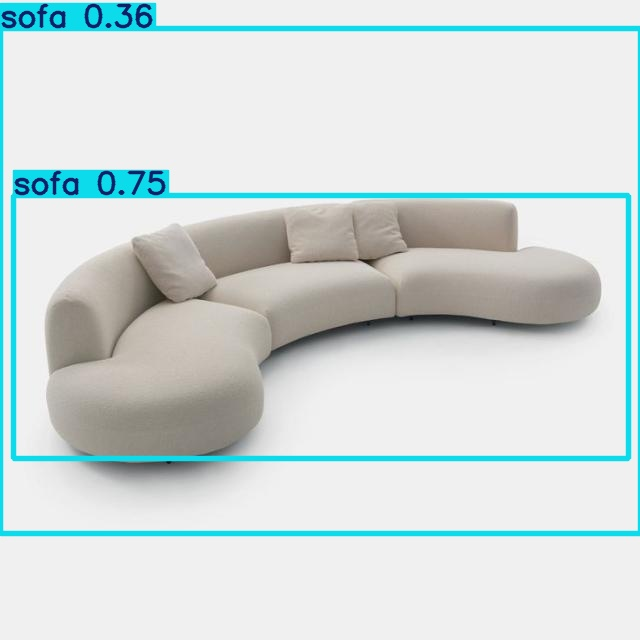

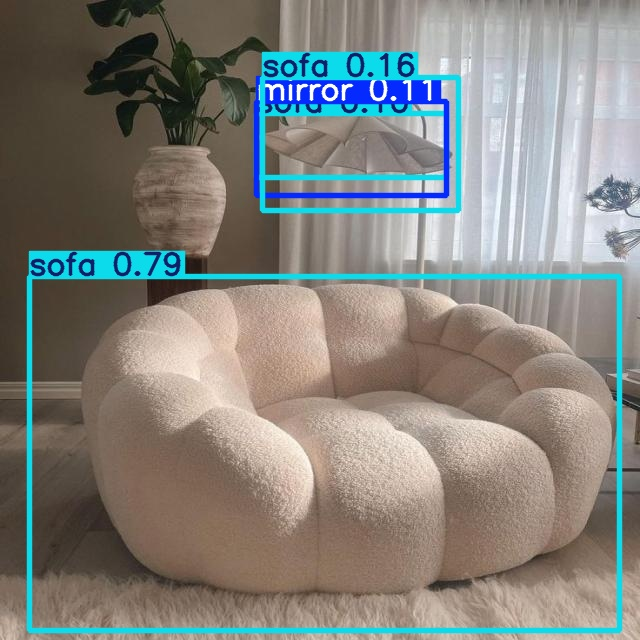

In [12]:
#display inference on ALL test images

import glob
from IPython.display import Image, display
i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i +=1

  if i<13:
    display(Image(filename=imageName))
print("\n")